# Implementation of the Lime explainer using Lucid on the Imagenet model

Also contains deepdream snippets

##### Copyright 2018 Google LLC.

Licensed under the Apache License, Version 2.0 (the "License");

In [ ]:
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Install and Imports

In [ ]:
%tensorflow_version 1.x

In [ ]:
!pip -q install lucid>=0.3.1

import numpy as np
import tensorflow as tf
import lucid.modelzoo.vision_models as models
from lucid.misc.io import show, load, save, saving

# for resizing images
from PIL import Image

# for image uploader
from google.colab import files

# For plots
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
model = models.InceptionV1()
model.load_graphdef()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


AttributeError: ignored

In [ ]:
def classify2(test_image, n=10, show_output=True):
  test_image = test_image[0]
  tf.reset_default_graph()

  with tf.Session().as_default() as sess:
    input_t = tf.placeholder(tf.float32, shape=(224,224,3))
    model.import_graph(input_t)
    softmax2_t = sess.graph.get_tensor_by_name('import/softmax2:0')
    tf.global_variables_initializer().run()
    logits, = sess.run([softmax2_t], {input_t: test_image})
  
  BATCH = 0
  top_n_label_indices = np.argsort(logits)[BATCH][-n:][::-1]
  safe_top_n_label_indices = np.extract(top_n_label_indices < 1001, top_n_label_indices)
  top_n_labels = np.array(model.labels)[safe_top_n_label_indices]
  top_n_probs = logits[BATCH][safe_top_n_label_indices]
  max_length = max(len(label) for label in top_n_labels)
  predictions = ["{}: {: >6.2%}".format(label.rjust(max_length), prob) for (label, prob) in zip(top_n_labels, top_n_probs)]

  diction = []
  for (label, prob) in zip(top_n_labels, top_n_probs):
    datapoint = {"y":prob * 100, "label": label  }
    diction.append(datapoint)

  diction = list(reversed(diction))
  print(diction)
  
  if show_output:
    show(test_image)
    print("\n".join(predictions))
  
  return logits

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
snorkel_url = "https://i.guim.co.uk/img/media/66373f46ae3d9d5de88645ed4a9dd7478b597a69/0_194_4507_2705/master/4507.jpg?width=1200&height=1200&quality=85&auto=format&fit=crop&s=f11e0bad88882d9bf554836abe9a75bd"
grey_whale_url = "https://storage.googleapis.com/lucid-static/activation-atlas/adversarial-examples/examples/grey-whale.jpg"
frying_pan_url = "https://storage.googleapis.com/lucid-static/activation-atlas/adversarial-examples/examples/frying-pan.png"

In [ ]:
snorkel_img = load("/content/val_18.JPEG")
im = Image.fromarray(np.uint8(snorkel_img * 255.));
im_resize = im.resize((224, 224), Image.LANCZOS)
im_array = np.asarray(im_resize)/255.
test_image = im_array[:,:,:3]
saving.save_img(test_image, "/content/drive/MyDrive/deep_learning/" + "elephant" + ".png")
print(test_image.shape)
classify2([test_image])

NotFoundError: ignored

In [ ]:
%load_ext autoreload
%autoreload 2
!pip install -q lime
import os,sys
try:
    import lime
except:
    sys.path.append(os.path.join('..', '..')) # add the current directory
    import lime
from lime import lime_image

     |████████████████████████████████| 276kB 10.6MB/s 


In [ ]:
explainer = lime_image.LimeImageExplainer()

In [ ]:
%%time
# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
explanation = explainer.explain_instance(test_image, classify2, top_labels=3, batch_size = 1, hide_color=0, num_samples=1000)


CPU times: user 7min 59s, sys: 15.5 s, total: 8min 14s
Wall time: 8min 12s


In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


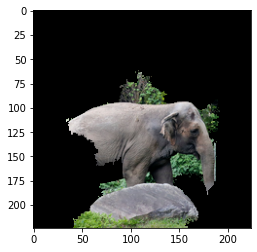

In [ ]:
from skimage.segmentation import mark_boundaries
from lucid.misc.io import saving
import skimage.morphology
for i in range(1,11):
  temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=i ,hide_rest=True)
  plt.imshow(temp)

  saving.save_img(temp, "elephant_lime/elephant" + str(i) +".png")

In [ ]:
!cp -r /content/elephant_lime/ /content/drive/MyDrive/deep_learning/elephant_lime/

##Feature inversion and deepdream

In [ ]:
import lucid.modelzoo.vision_models as models
import lucid.optvis.objectives as objectives
import lucid.optvis.param as param
import lucid.optvis.render as render
import lucid.optvis.transform as transform
from lucid.misc.io import show, load
from lucid.misc.io.reading import read
import scipy.ndimage as nd

def imgToModelSize(arr):
  W = model.image_shape[0]
  w, h, _ = arr.shape
  s = float(W) / min(w,h)
  arr = nd.zoom(arr, [s, s, 1], mode="nearest")
  w, h, _ = arr.shape
  dw, dh = (w-W)//2, (h-W)//3
  return arr[dw:dw+W, dh:dh+W]

@objectives.wrap_objective
def dot_compare(layer, batch=1, cossim_pow=0):
  def inner(T):
    dot = tf.reduce_sum(T(layer)[batch] * T(layer)[0])
    mag = tf.sqrt(tf.reduce_sum(T(layer)[0]**2))
    cossim = dot/(1e-6 + mag)
    return dot * cossim ** cossim_pow
  return inner

In [ ]:
def feature_inversion(img=None, layer=None, n_steps=512, cossim_pow=0.0):
  with tf.Graph().as_default(), tf.Session() as sess:
    img = imgToModelSize(img)
    
    objective = objectives.Objective.sum([
        1.0 * dot_compare(layer, cossim_pow=cossim_pow),
        objectives.blur_input_each_step(),
        -1 * objectives.input_diff(img),
    ])

    t_input = tf.placeholder(tf.float32, img.shape)
    param_f = param.image(img.shape[0], decorrelate=True, fft=True, alpha=False)
    param_f = tf.stack([param_f[0], t_input])

    transforms = [
      transform.pad(8, mode='constant', constant_value=.5),
      transform.jitter(8),
      transform.random_scale([0.9, 0.95, 1.05, 1.1] + [1]*4),
      transform.random_rotate( [1,2,3,4,5,-1,-2,-3,-4,0,0]),
      transform.jitter(2),
    ]

    T = render.make_vis_T(model, objective, param_f, transforms=transforms)
    loss, vis_op, t_image = T("loss"), T("vis_op"), T("input")
    thresholds = []
    tf.global_variables_initializer().run()
    for i in range(n_steps): 
      _ = sess.run([vis_op], {t_input: img})
      rate = 5
      if (i > 100):
        rate = 10
      if(i %rate == 0):
        result = t_image.eval(feed_dict={t_input: img})
        # show(result[0])
        thresholds.append(result[0])

    result = t_image.eval(feed_dict={t_input: img})
    for i in range(20):
      thresholds.append(result[0])
    show(result[0])
    return thresholds


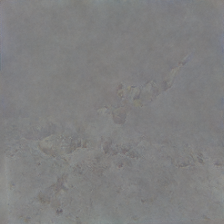


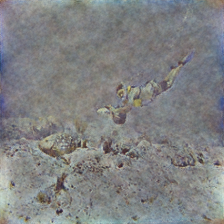


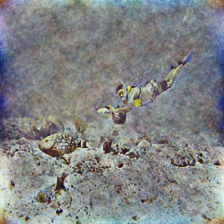


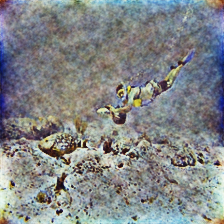


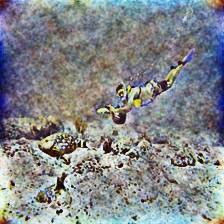


...


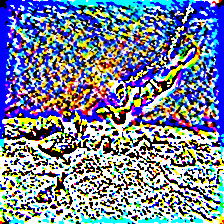


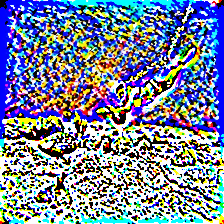


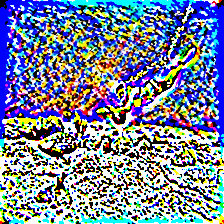


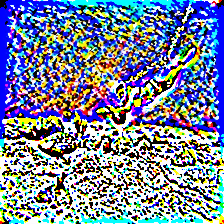


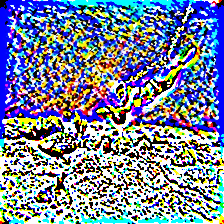

In [ ]:
thresholds = feature_inversion(test_image, layer='conv2d0')

In [ ]:
from PIL import Image

In [ ]:
print(len(thresholds))
imlist = []
for simp in thresholds:
  im = Image.fromarray(np.uint8(simp*255))
  imlist.append(im)



imlist[0].save('out_1.gif', save_all=True, append_images=imlist[1:], duration=100, loop=0)

82


In [ ]:
directory = "/content/conv_gifs/"

def create_convolution_animations(layername, imagename, image):
  thresholds = feature_inversion(image, layer=layername)
  imlist = []
  for simp in thresholds:
    im = Image.fromarray(np.uint8(simp*255))
    imlist.append(im)
  imlist[0].save(  directory + imagename +"_"+ layername +".gif", save_all=True, append_images=imlist[1:], duration=100, loop=0, optimize = True)


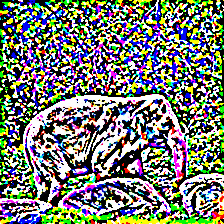


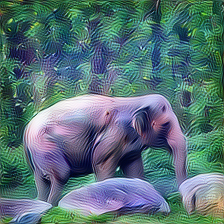


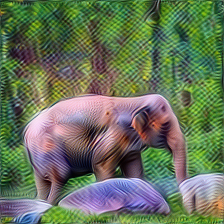


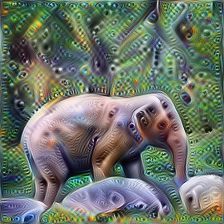


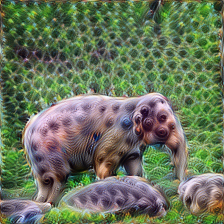


...


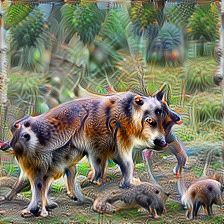


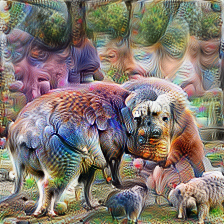


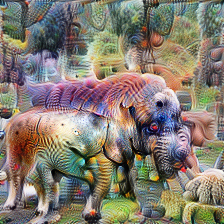


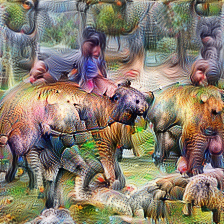


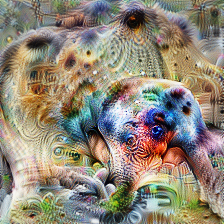

In [ ]:
layers = ['conv2d%d' % i for i in range(0, 3)] + ['mixed3a', 'mixed3b', 
                                                  'mixed4a', 'mixed4b', 'mixed4c', 'mixed4d', 'mixed4e',
                                                  'mixed5a', 'mixed5b']
for layer in layers:
  create_convolution_animations(layer, "elephant", test_image)

In [ ]:
!cp -r /content/conv_gifs/ /content/drive/MyDrive/deep_learning/gifs_n/

In [ ]:
ls -lh

total 5.2M
-rw-r--r-- 1 root root    0 Dec 10 22:17 '=0.3.1'
drwxr-xr-x 2 root root 4.0K Dec 11 02:17  convolution_gifs/
drwx------ 5 root root 4.0K Dec 10 23:37  drive/
-rw-r--r-- 1 root root 3.2M Dec 11 01:53  out_1.gif
-rw-r--r-- 1 root root 1.5M Dec 11 00:09  out.gif
drwxr-xr-x 1 root root 4.0K Dec  2 22:04  sample_data/
-rw-r--r-- 1 root root  17K Dec 10 23:34  scuba_1.png
-rw-r--r-- 1 root root  27K Dec 10 23:34  scuba_2.png
-rw-r--r-- 1 root root  35K Dec 10 23:34  scuba_3.png
-rw-r--r-- 1 root root  44K Dec 10 23:34  scuba_4.png
-rw-r--r-- 1 root root  47K Dec 10 23:34  scuba_5.png
-rw-r--r-- 1 root root  51K Dec 10 23:34  scuba_6.png
-rw-r--r-- 1 root root  54K Dec 10 23:34  scuba_7.png
-rw-r--r-- 1 root root  60K Dec 10 23:34  scuba_8.png
-rw-r--r-- 1 root root  62K Dec 10 23:34  scuba_9.png
drwxr-xr-x 2 root root 4.0K Dec 10 23:38  scuba_lime/
-rw-r--r-- 1 root root  63K Dec 10 23:33  scuba.png


In [ ]:
print(img.shape)
mask_3d = np.tile(mask,(3,1,1))
print(mask_3d.shape)

(224, 224, 3)
(3, 224, 224)


In [ ]:
mask_3d = np.moveaxis(mask_3d, 0, -1)
print(result)

[[[0.03756437 0.05939752 0.3984686 ]
  [0.02887136 0.04999205 0.35077196]
  [0.03459853 0.08388743 0.53077924]
  ...
  [0.04351175 0.22154826 0.49826023]
  [0.03941393 0.20394158 0.5223355 ]
  [0.04949626 0.13609883 0.39721674]]

 [[0.02044567 0.03787211 0.38154164]
  [0.02812797 0.04999864 0.46537656]
  [0.02673504 0.05648658 0.45246723]
  ...
  [0.03279555 0.13559812 0.4119316 ]
  [0.0452404  0.15894434 0.5343288 ]
  [0.04780006 0.07364842 0.29442355]]

 [[0.02052096 0.02914038 0.34068537]
  [0.07786986 0.09614637 0.51979417]
  [0.03088871 0.07614952 0.42824012]
  ...
  [0.05653289 0.23793226 0.5975296 ]
  [0.07620788 0.2568791  0.6539606 ]
  [0.03083286 0.07438216 0.32561746]]

 ...

 [[0.4154056  0.58076954 0.53513205]
  [0.53185666 0.6611734  0.5861202 ]
  [0.5009165  0.65704757 0.537749  ]
  ...
  [0.42837343 0.63620895 0.6324702 ]
  [0.5188282  0.6792488  0.6586698 ]
  [0.3979948  0.45516005 0.55676794]]

 [[0.46936244 0.5930834  0.5854502 ]
  [0.49198392 0.6864705  0.60458374]


In [ ]:

masked_array = np.copyto(temp, result, where=mask_3d == 1)



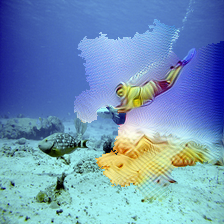

In [ ]:
show(temp)